## Введение в анализ данных, ИАД-1

## НИУ ВШЭ, 2019-20 учебный год

### Домашнее задание №2

Задание выполнил: Золотарев Антон Олегович, БСТ182 

### Общая информация

__Дата выдачи:__ 08.03.2019

__Дедлайн:__ 23:59 18.03.2019

### Оценивание и штрафы

Оценка за ДЗ вычисляется по следующей формуле:

$$
\text{points} \times 10 / \text{max points},
$$

где points — количество баллов, которое вы набрали, max_points - максимальное число баллов за задание. Бонусные задания отмечены звездочками (*)

За сдачу задания позже срока на итоговую оценку за задание накладывается штраф в размере 1 балл в день, но получить отрицательную оценку нельзя.

__Внимание!__ Домашнее задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов.

### Формат сдачи

Загрузка файлов с решениями происходит в системе [Anytask](https://anytask.org/).


# kNN своими руками (4)

Реализуйте взвешенный алгоритм kNN для регрессии. Пусть нам нужно вычислить значение $y$ для некоторого $x$ при известных данных $\left(x_1, y_1\right), \ldots, \left(x_\ell, y_\ell\right)$. Предсказанием вашего регрессора будет являться

$$
\hat{y} = \frac{\sum\limits_{i=1}^kw_iy_{(i)}}{\sum\limits_{i=1}^kw_i},
$$
где $\left(x_{(1)}, y_{(1)}\right), \ldots, \left(x_{(k)}, y_{(k)}\right)$ - ближайшие $k$ объектов к $x$ по некоторой метрике $d(\cdot, \cdot)$, а $w_i = \frac{1}{d\left(x, x_{(i)}\right)}$. Ваш алгоритм должен уметь работать с двумя метриками:

$$
d\left(x_{(i)}, x\right) = \|x_{(i)} - x\|_2 = \sqrt{\sum\limits_{j=1}^n\left(x_{(i)}^j - x^j\right)^2}\qquad\text{(евклидова)}
$$
$$
d\left(x_{(i)}, x\right) = \|x_{(i)} - x\|_1 = \sum\limits_{j=1}^n\left|x_{(i)}^j - x^j\right|\qquad\text{(манхэттена)}
$$

Сверьте для нескольких комбинаций различных параметров свой результат на искусственной выборке с результатом соответствующего алгоритма из `sklearn` по метрике качества MSE.

In [1]:
class KNN:
    def __init__(self, metric='euclid', k=5):
        """
        PARAMETERS:
        metric ('euclid' or 'manhattan')
        k - number of nearest neighbors
        """
        
        self.metric = metric
        self.k = k
        
        self.X_train = None
        self.y_train = None
    
    @staticmethod
    def distance(x_opt, x, metric = 'euclid'):
        if metric == 'euclid':
            return np.sqrt(np.sum((x_opt - x)**2, axis = 1))
        else:
            return np.sum(np.abs(x_opt-x), axis =1)
        
    def fit(self, X_train, y_train):
        """
        INPUT:
        X_train - np.array of shape (l, d)
        y_train - np.array of shape (l,)
        """
        self.X_train = X_train
        self.y_train = y_train
        return self
        
    def predict(self, X_test):
        """
        INPUT:
        X_test - np.array of shape (m, d)
        
        OUTPUT:
        y_pred - np.array of shape (m,)
        
        """
        y_pred = np.zeros((X_test.shape[0],))
        for i in range(len(X_test)):
            distance = KNN.distance(X_test[i], self.X_train, self.metric)
            neighbor = np.argsort(distance)[:self.k]
            weights = 1/distance[neighbor]
            y_pred[i] = np.sum(weights*self.y_train[neighbor])/np.sum(weights)
        
        return y_pred
        pass

In [3]:
import numpy as np
np.random.seed(17032019)
X_train = np.random.randn(1000, 50)
y_train = np.random.randn(1000,)
X_test = np.random.randn(500, 50)
y_test = np.random.randn(500,)

In [4]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

In [5]:
knn = KNeighborsRegressor(n_neighbors=5, weights='uniform')

In [6]:
knn.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [7]:
predictions = knn.predict(X_test)

In [8]:
sklearn_knn_mse = mean_squared_error(y_test, predictions)

In [9]:
my_knn = KNN()
my_knn.fit(X_train, y_train)
my_pred = my_knn.predict(X_test)
my_knn_mse = mean_squared_error (y_test, my_pred)

In [10]:
print('Среднеквадратичная ошибка для встроенного алгоритма кнн составляет',sklearn_knn_mse)
print('Среднеквадратичная ошибка для написанного мной алгоритма кнн составляет',my_knn_mse)

Среднеквадратичная ошибка для встроенного алгоритма кнн составляет 1.143019350619603
Среднеквадратичная ошибка для написанного мной алгоритма кнн составляет 1.143364989935662


Как видно, мой алгоритм даёт лишь на **0,00035** большую ошибку, чем встроенный алгоритм. Вроде не так уж и плохо! :)

# Линейная регрессия своими руками (4)

Реализуйте линейную регрессию с градиентным спуском для [функции потерь Хьюбера](https://en.wikipedia.org/wiki/Huber_loss):

$$
L_\delta\left(y, \hat{y}\right) =
\begin{cases}
\frac{1}{2}\left(y - \hat{y}\right)^2, \qquad &|y - \hat{y}| \leq \delta\\
\delta\left|y - \hat{y}\right| - \frac{1}{2}\delta^2,\qquad & \text{otherwise}
\end{cases}
$$

В таком случае общее значение функции потерь на всем датасете $(x_1, y_1), \ldots, (x_\ell, y_\ell)$ будет равно

$$
L = \frac{1}{\ell}\sum\limits_{i=1}^\ell L_\delta\left(y_i, \hat{y}_i\right)
$$

Проверьте работу вашего метода: выведите результаты его работы на той же искусственной выборке, что и в задаче выше (в качестве метрик качества используйте MSE и Huber loss). Постройте график зависимости значения функции потерь от итерации градиентного спуска.

*Вы можете опустить единичный признак в модели и не добавлять его в данные. Для данной искусственной выборки это не актуально, потому что целевая переменная в этом случае является случайной величиной из стандартного нормального распределения со средним 0.*

*Вектор весов в градиентном спуске можете инициализировать нулями.*

In [11]:
class LinearRegressionHuber:
    def __init__(self, delta=1.0, max_iter=1000, tol=1e-6, eta=1e-2):
        """
        PARAMETERS:
        delta - scalar in Huber loss
        max_iter - maximum possible number of iterations in Gradient Descent
        tol - precision for stopping criterion in Gradient Descent
        eta - step size in Gradient Descent
        """
        
        self.delta = delta
        self.max_iter = max_iter
        self.tol = tol
        self.eta = eta
        
        self.w = None
        self.loss_history = None
    
    def fit(self, X_train, y_train):
        """
        INPUT:
        X_train - np.array of shape (l, d)
        y_train - np.array of shape (l,)
        """

        self.X_train = X_train
        self.y_train = y_train
        self.loss_history = np.zeros((self.max_iter + 1,))
        self.w = [0]*len(X_train[1])
        self.loss_history[0] = LinearRegressionHuber.calc_loss(self, X_train, y_train)
        for i in range(self.max_iter):
            if LinearRegressionHuber.calc_loss(self, X_train, y_train) <= self.tol:
                break
            self.w = self.w - self.eta * LinearRegressionHuber.calc_gradient(self, X_train, y_train)
            self.loss_history[i+1] = LinearRegressionHuber.calc_loss(self, X_train, y_train)
        
        return self.loss_history
        
    def predict(self, X_test):
        """
        INPUT:
        X_test - np.array of shape (m, d)
        
        OUTPUT:
        y_pred - np.array of shape (m,)
        """

        return X_test @ self.w
        pass
    
    def calc_gradient(self, X, y):
        """
        Calculates the gradient of Huber loss by weights.
        
        INPUT:
        X - np.array of shape (l, d)
        y - np.array of shape (l,)
        
        OUTPUT:
        grad - np.array of shape (d,)
        """

        for i in range(len(X)):
            m = X@self.w - y
            if np.abs(m).all() > self.delta:
                return self.delta * X.T @ np.sign(m) / len(y)
            else:
                return X.T @(X@self.w - y) / len(y)
        
        pass
    
    def calc_loss(self, X, y):
        """
        Calculates the Huber loss.
        
        INPUT:
        X - np.array of shape (l, d)
        y - np.array of shape (l,)
        
        OUTPUT:
        loss - float
        """
        if np.abs(X@self.w - y).all()<=self.delta:
            return np.sum(0.5*(X@self.w - y)**2)/len(X)
        else:
            return np.sum(np.abs(X@self.w - y)*self.delta-0.5*self.delta**2)/len(X)
        pass

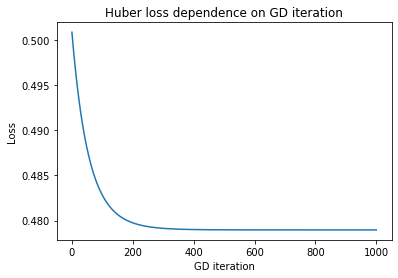

In [15]:
import matplotlib.pyplot as plt
np.random.seed(17032019)
X_train = np.random.randn(1000, 50)
y_train = np.random.randn(1000,)
X_test = np.random.randn(500, 50)
y_test = np.random.randn(500,)
Huber = LinearRegressionHuber()


loss_hist = Huber.fit(X_train, y_train)
loss = Huber.calc_loss(X_train, y_train)
GD_iteration = np.arange(0, len(Huber.loss_history), 1)
y = plt.subplot()
y.set_title('Huber loss dependence on GD iteration')
y.set_ylabel('Loss')
y.set_xlabel('GD iteration')
plt.plot(GD_iteration, Huber.loss_history)

In [16]:
print('Функция потерь Хьюбера составляет', Huber.loss_history[-1])
print('MSE между предсказаниями и значениями на тестовой выборке:', mean_squared_error(Huber.predict(X_test), y_test))

Функция потерь Хьюбера составляет 0.4789674207234101
MSE между предсказаниями и значениями на тестовой выборке: 1.0853437986334125


# Практика

Пожалуйста, при использовании различных функций из библиотек импортируйте все, что вам понадобилось в данной части, в следующем блоке:

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.feature_selection import VarianceThreshold, SelectKBest, SelectFromModel, f_regression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures, LabelEncoder, OneHotEncoder, OrdinalEncoder

%matplotlib inline

В этом домашнем задании вы поработаете с данными из другого соревнования на Kaggle: https://www.kaggle.com/c/house-prices-advanced-regression-techniques. Задача - предсказание цены дома.

In [66]:
data = pd.read_csv('Untitled folder/train.csv', header=0)

In [67]:
data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [68]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [69]:
data.drop('Id', axis=1, inplace=True)

## 1 (1)

Есть ли в данных пропуски? Если да, то для каждого столбца, в котором они имеются, посчитайте их количество и их долю от общего числа значений. Что вы наблюдаете?

In [70]:
data.isnull().any().any()

True

In [71]:
for i in data.columns:
    if data[i].isnull().any() == True:
        print('Количество пропусков в ', i, ' составляет ', sum(data[i].isnull()), '.', '\n Доля пропусков в ', i, 
              ' составляет ', round(sum(data[i].isnull())/len(data[i]), 3), '.', '\n', sep='')

Количество пропусков в LotFrontage составляет 259.
 Доля пропусков в LotFrontage составляет 0.177.

Количество пропусков в Alley составляет 1369.
 Доля пропусков в Alley составляет 0.938.

Количество пропусков в MasVnrType составляет 8.
 Доля пропусков в MasVnrType составляет 0.005.

Количество пропусков в MasVnrArea составляет 8.
 Доля пропусков в MasVnrArea составляет 0.005.

Количество пропусков в BsmtQual составляет 37.
 Доля пропусков в BsmtQual составляет 0.025.

Количество пропусков в BsmtCond составляет 37.
 Доля пропусков в BsmtCond составляет 0.025.

Количество пропусков в BsmtExposure составляет 38.
 Доля пропусков в BsmtExposure составляет 0.026.

Количество пропусков в BsmtFinType1 составляет 37.
 Доля пропусков в BsmtFinType1 составляет 0.025.

Количество пропусков в BsmtFinType2 составляет 38.
 Доля пропусков в BsmtFinType2 составляет 0.026.

Количество пропусков в Electrical составляет 1.
 Доля пропусков в Electrical составляет 0.001.

Количество пропусков в FireplaceQu

In [72]:
#Проверим, какова площадь бассейна, когда показатель качества бассейна не указан 
data['PoolArea'].where(data['PoolQC'].isnull()).mean()

0.0

In [73]:
data['Fireplaces'].where(data['FireplaceQu'].isnull()).mean()

0.0

In [74]:
data['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [75]:
data['PoolQC'].unique()

array([nan, 'Ex', 'Fa', 'Gd'], dtype=object)

Наибольшая доля пропусков наблюдается в признаках **Alley, PoolQC, Fence и MiscFeature** , где пропуски наблюдаются более чем в 80% исследований (также у **FireplaceQu** около 50% пропусков, в остальных случаях доля меньше 0.1). В случае качества бассейна и камина, а также забора высокая доля пропусков объясняется отсутствием бассейнов, каминов и заборов в большинстве продаваемых домов, что делает бессмысленным заполнение данного показателя. В свою очередь, тип доступа к улице и дополнительные особенности являются специфичными показателями, которые вполне могут отсутствовать у абсолютного большинства исследуемых объектов. 

Остальные объекты в большинстве своём также пропущены по причине их отсутствия в продаваемом доме.

## 2 (1)

Избавьтесь от пропусков. Для каждого из примененных методов обоснуйте свое решение. **Проверьте, что вы действительно избавились от пропусков.**

*Напоминание. В зависимости от типа столбца, можно заполнить пропуски, например, средним арифметическим, медианой, модой, можно какими-то отдельными значениями. А можно такие столбцы вообще удалить.*

In [76]:
data['LotFrontage'].describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [77]:
#вспомогательная статистика для заполнения MasVnrType
data['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [78]:
#Вспомогательная статистика для заполнения MasVnrArea
data['MasVnrArea'][data['MasVnrArea']>0].describe()

count     591.000000
mean      254.739425
std       205.144174
min         1.000000
25%       113.000000
50%       203.000000
75%       330.500000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [79]:
#вспомогательная статистика для заполнения BsmtQual
data['BsmtQual'].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [80]:
#вспомогательная статистика для заполнения Electrical
data['Electrical'].value_counts()

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [81]:
#Заполним половину пропусков в стоблце "Площадь перед домом" средним значением, половину - медианным, 
#чтобы описательная статистика изменилась лишь незначительно
data['LotFrontage'].fillna(data['LotFrontage'].mean(), inplace = True, limit=sum(data['LotFrontage'].isnull())//2)
data['LotFrontage'].fillna(69, inplace = True) #в ГС медиана была 69

#тип дорожки к дому можно и удалить, поскольку значения имеются лишь для 6% домов, 
#тогда как разница между гравием и брусчаткой не столь значительна, 
#чтобы сокрывать в себе фундаментальное различие в цене
data.drop('Alley', axis=1, inplace = True)

#Заполним пропуски в MasVnrType пропорционально долям каждого из типов кровли в ГС
data['MasVnrType'].fillna('BrkFace', inplace = True, limit=int(448/1452*8))
data['MasVnrType'].fillna('Stone', inplace = True, limit=int(128/1452*8)+1)
#data['MasVnrType'].fillna('BrkCmn', inplace = True, limit=int(15/1452*8)) limit=0 => нечего заполнять
data['MasVnrType'].fillna('None', inplace = True)

#В площади кровли заполним нулями те пропущенные значения, которые заполнили "None" в предыдущем столбце, 
#остальные заполним средним от среднего и медианы
data['MasVnrArea'].fillna((254.74+203)/2, inplace = True, limit=int((1451-864)/1452*8))
data['MasVnrArea'].fillna(0, inplace = True)

#Во всех связанных с подвалом показателях заполним пропуске категориальным признаком,
#означающим отсутствие подвала, как и указано в описании исходных данных
for i in ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']:
    data[i].fillna('NoBsmt', inplace = True)

#Заполняем единственный пропуск наиболее популярным значением
data['Electrical'].fillna('SBrkr', inplace = True)

#В оставшихся столбцах заполним пропуски в соотвествии с исходным описанием данных, 
#где пропуск означает отсутствие той или иной дополнительной опции в доме
data['FireplaceQu'].fillna('NoF', inplace = True)
for i in ['GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']:
    data[i].fillna('NoG', inplace = True)
data['PoolQC'].fillna('NoP', inplace = True)
data['Fence'].fillna('NoF', inplace = True)
data['MiscFeature'].fillna('NoMF', inplace = True)

In [18]:
data.isnull().any().any()

False

## 3 (1)

Обработайте категориальные признаки. В их обнаружении вам может помочь синтаксис `pandas` (например, можно обратить внимание на типы столбцов), а также описание датасета и его исследование. Объясните выбор метода (one-hot-encoding, label encoding, ...)

In [38]:
categ_col = data.columns[data.dtypes == 'object']
data[categ_col].head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,2003,RFn,TA,TA,Y,NoP,NoF,NoMF,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,1976,RFn,TA,TA,Y,NoP,NoF,NoMF,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,2001,RFn,TA,TA,Y,NoP,NoF,NoMF,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,1998,Unf,TA,TA,Y,NoP,NoF,NoMF,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,2000,RFn,TA,TA,Y,NoP,NoF,NoMF,WD,Normal


In [84]:
data_cat = data[data.columns[(data.dtypes == "object").values]]
data_cat_dum = pd.get_dummies(data_cat, drop_first=True)
print(data_cat.shape)
print(data_cat_dum.shape)
data_cat_dum.head()

(1460, 43)
(1460, 318)


,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [85]:
encoded = pd.get_dummies(data, drop_first=True)
encoded.shape

(1460, 354)

In [55]:
broken_encoded = pd.DataFrame(OneHotEncoder(sparse=False).fit_transform(data[categ_col]))
broken_encoded.head()
# Я не понимаю что происходит

TypeError: argument must be a string or number

## 4 (0.5)

Вычислите и визуализируйте попарную корреляцию Пирсона между всеми признаками. Какие выводы можно сделать?

*Для визуализации можно использовать `seaborn.heatmap()`.*

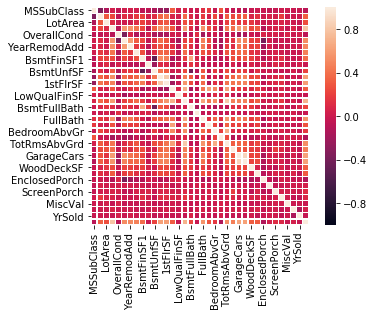

In [92]:
#Для количественных данных
cor_mat = pd.DataFrame(data).corr()
sns.heatmap(cor_mat, vmin = -1, vmax = 1, linewidths = 0.5, square = True)

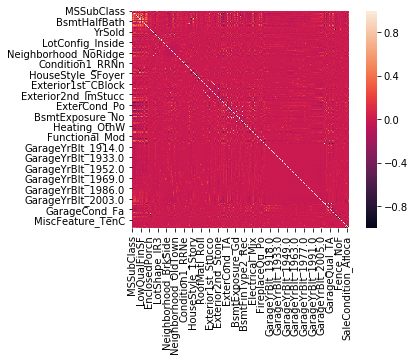

In [95]:
#Для перекодированных категориальных и вещественных
cor_mat2 = encoded.corr()
sns.heatmap(cor_mat2, vmin = -1, vmax = 1, linewidths = 0.000001, square = True)

In [87]:
cor_mat[abs(cor_mat) > 0.5].tail()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
PoolArea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
MiscVal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
MoSold,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
YrSold,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
SalePrice,NaN,NaN,NaN,0.790982,NaN,0.522897,0.507101,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


Видно, что большинство показателей почти не коррелируют друг с другом, что, в принципе, ожидаемо ввиду столь значительных различий в показателях, ведь далеко не всегда в доме с просторным бассейном также имеется гараж высокого качества.

Однако наибольший интерес в данной матрице представляют те немногие показатели, корреляция Пирсона между которыми по абсолютному значению стремится к единице.

## 5 (0.5)

Найдите признаки с максимальным и минимальным **абсолютным** значением коэффициента корреляции Пирсона с предсказываемым значением. Изобразите на графиках зависимость найденных признаков от предсказываемого значения.

*Не забудьте указать название графика и обозначить, что изображено по каждой из осей.*

In [83]:
#Я понял "коэффициент корреляции с предсказываемым значением" как корреляцию с ожидаемой ценой продажи
#Если это неверная интерпретация, то код должен быть таким:
#cor_mat.idxmin() для минимального и cor_mat.idxmax(except itself)
amax, ind_amax = 0, 0
amin, ind_amin = 1, 0
for i in range(len(cor_mat)-1):
    if abs(cor_mat.iloc[-1, i])>amax:
        amax=cor_mat.iloc[-1, i]
        ind_amax=cor_mat.columns[i]
    elif abs(cor_mat.iloc[-1, i])<amin:
        amin=cor_mat.iloc[-1, i]
        ind_amin=cor_mat.columns[i]
print(ind_amax, round(amax, 3))
print(ind_amin, round(amin, 3))

OverallQual 0.791
OverallCond -0.078


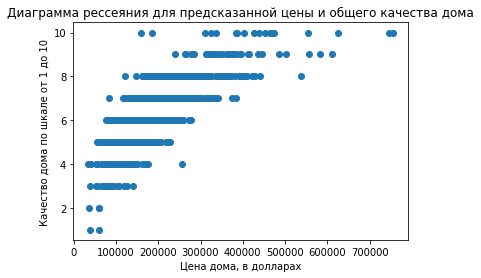

In [84]:
plt.scatter(data['SalePrice'], data['OverallQual'])
plt.xlabel('Цена дома, в долларах')
plt.ylabel('Качество дома по шкале от 1 до 10')
plt.title('Диаграмма рессеяния для предсказанной цены и общего качества дома')
plt.show()

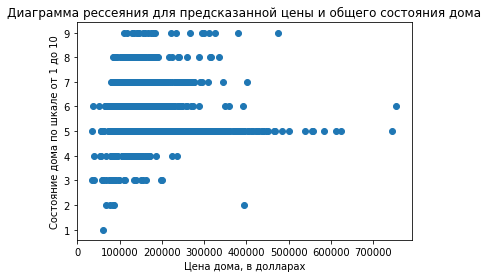

In [85]:
plt.scatter(data['SalePrice'], data['OverallCond'])
plt.xlabel('Цена дома, в долларах')
plt.ylabel('Состояние дома по шкале от 1 до 10')
plt.title('Диаграмма рессеяния для предсказанной цены и общего состояния дома')
plt.show()

## 6 (0.5)

Постройте гистограмму распределения предсказываемого значения. Для избавления от разницы в масштабах, а также «смещения» распределения переменной в сторону нормального (что бывает полезно при статистическом анализе), можно прологарифмировать ее (это обратимое преобразование, поэтому целевую переменную легко восстановить). В данном случае воспользуйтесь `numpy.log1p`, чтобы сделать преобразование $y \to \ln\left(1 + y\right)$. Постройте гистограмму распределения от нового предсказываемого значения. Опишите наблюдения.

*В дальнейшем используйте в качестве предсказываемого значения вектор, который получился после логарифмирования.*

Text(0.5, 1.0, 'Цена продажи недвижимости')

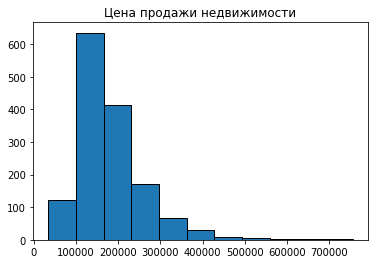

In [86]:
from math import log2

plt.hist(data['SalePrice'], bins=int(1+log2(len(data))), edgecolor='black')
plt.title('Цена продажи недвижимости')

Text(0.5, 1.0, 'Цена продажи недвижимости')

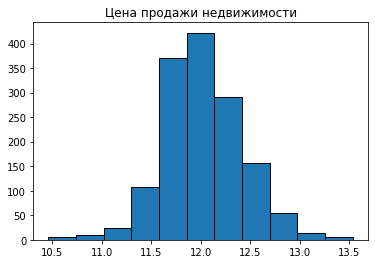

In [91]:
y = np.log1p(data['SalePrice'])
plt.hist(y, bins=int(1+log2(len(data))), edgecolor='black')
plt.title('Цена продажи недвижимости')

Перейдем непосредственно к построению моделей. Разобьем выборку на обучение и контроль.

*Пожалуйста, **не меняйте** значение `random_state` в следующей ячейке.*

In [95]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,NoP,NoF,NoMF,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,NoP,NoF,NoMF,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,NoP,NoF,NoMF,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,NoP,NoF,NoMF,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,NoP,NoF,NoMF,0,12,2008,WD,Normal,250000


In [96]:
X = encoded.drop(['SalePrice'], axis = 1)
y = np.log1p(data['SalePrice'])
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=17032019)

In [97]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1095, 353), (365, 353), (1095,), (365,))

## 7 (2)

Примените к данным следующие алгоритмы:

- kNN
- линейная регрессия
- Lasso
- Ridge

Для каждого из методов подберите гиперпараметры с помощью кросс-валидации. Обучите алгоритмы с лучшими гиперпараметрами на обучающей выборке и оцените качество по метрике **Root** Mean Squared Error. Какой из методов показывает себя лучше?

# $ KNN $

In [98]:
grid_searcher_knn = GridSearchCV(
    KNeighborsRegressor(),
    param_grid={
        'n_neighbors': range(1, 40, 2),
        'weights': ['uniform', 'distance'],
        'p': [1, 2, 3]
    },
    cv=5
)

In [99]:
grid_searcher_knn.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': range(1, 40, 2), 'p': [1, 2, 3],
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [101]:
grid_searcher_knn.best_params_

{'n_neighbors': 7, 'p': 1, 'weights': 'distance'}

In [102]:
def RMSE (x, y):
    return mean_squared_error(x, y)**(1/2)

In [107]:
print('Качество алгоритма KNN при оптимальных гиперпараметрах составляет', round(RMSE(grid_searcher_knn.predict(X_val), y_val), 3))

Качество алгоритма KNN при оптимальных гиперпараметрах составляет 0.196


# $Линейная \space регрессия$

In [127]:
grid_searcher_lr = GridSearchCV(
    LinearRegression(),
    param_grid={
        'fit_intercept': [True, False], 
        'normalize': [True, False], 
        'copy_X': [True, False], 
        'n_jobs': [None, 1, 2, 3, 4]
    },
    cv=5
)
grid_searcher_lr.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                        n_jobs=None, normalize=False),
             iid='warn', n_jobs=None,
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'n_jobs': [None, 1, 2, 3, 4],
                         'normalize': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [128]:
grid_searcher_lr.best_params_

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': False}

In [129]:
print('Качество линейной регрессии при оптимальных гиперпараметрах составляет', round(RMSE(grid_searcher_lr.predict(X_val), y_val), 3))

Качество линейной регрессии при оптимальных гиперпараметрах составляет 0.195


## $Lasso$

Не запускайте инпут ниже! Он работал всю ночь, компьютер пыхтел как не в себя!

Если всё-таки по несчастливой случайности запустили, а кнопка "стоп" не работет, то вот Вам **весёлые** тиктоки:

https://www.tiktok.com/@rom.kolchin/video/6804165097980710149

https://www.tiktok.com/@pocikfan123/video/6803414145979927813

https://www.tiktok.com/@babkaaye/video/6796229210550603013


In [114]:
grid_searcher_lasso = GridSearchCV(
    Lasso(),
    param_grid={
        'alpha': np.arange(0.0001, 1.001, 0.0001), 
        'tol': [0.1, 0.01, 0.001, 0.0001, 0.00001], 
        'positive': [True, False],
        'selection': ['cyclic', 'random']
    },
    cv=5
)
grid_searcher_lasso.fit(X_train, y_train)

C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.255916113479735, tolerance: 0.13429438011212985
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.7723518984922055, tolerance: 0.14920495365762992
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.255916113479735, tolerance: 0.013429438011212987
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 

KeyboardInterrupt: 

После 8 часов обучения я приостановил работу кросс-валидационного подбора гиперпараметров, на параллельном джупайтере проверил их оптимальные значения (честно-честно!), они будут записаны ниже:

In [116]:
l = Lasso (alpha= 0.001, positive = False, selection = 'random', tol = 1e-04)
l.fit(X_train, y_train)
RMSE(l.predict(X_val), y_val)

C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.3649048088302305, tolerance: 0.017781492634048914
  positive)


0.13013003181309893

## $Ridge$

In [122]:
#Тут я уже сделал выводы по альфе, примерно оценив её окрестность оптимальных значений
grid_searcher_ridge = GridSearchCV(
    Lasso(),
    param_grid={
        'alpha': [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.0009, 0.00095, 0.00105, 0.0011],
        'fit_intercept': [True, False], 
        'normalize': [True, False],  
        'tol': [0.0001, 0.001, 0.01,  0.1, 1], 
    },
    cv=5
)
grid_searcher_ridge.fit(X_train, y_train)

C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.108317688094193, tolerance: 12.695559837528238
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.718714029925211, tolerance: 12.659774031910684
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.984161347056933, tolerance: 12.689831408668725
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.1, 0.01, 0.001, 0.0001, 1e-05, 0.0009,
                                   0.00095, 0.00105, 0.0011],
                         'fit_intercept': [True, False],
                         'normalize': [True, False],
                         'tol': [0.0001, 0.001, 0.01, 0.1, 1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [123]:
grid_searcher_ridge.best_params_

{'alpha': 0.0009, 'fit_intercept': True, 'normalize': False, 'tol': 0.0001}

In [124]:
print('Качество Ridge при оптимальных гиперпараметрах составляет', round(RMSE(grid_searcher_ridge.predict(X_val), y_val), 3))

Качество Ridge при оптимальных гиперпараметрах составляет 0.13


## Итог номера 7

При всём при том, что я очень странным образом обработал категориальные данные, на всех предложенных алгоритмах при оптимальных гиперпараметрах корень среднеквадратичной ошибки весьма мал:

$
RMSE(KNN) = 0,196
$

$
RMSE(Linear \space Regression) = 0,195
$

$
RMSE(Lasso) = 0,13
$

$
RMSE(Ridge) = 0,13
$

Постройте гистограммы значений весов для линейной регрессии, Lasso и Ridge. Опишите наблюдения. В чем различия между полученными наборами весов и почему?

In [136]:
grid_searcher_lasso = GridSearchCV(
    Lasso(),
    param_grid={
        'alpha': np.arange(0.0001, 0.001, 0.00001), 
        'tol': [0.0001, 0.00001], 
        'positive': [False],
        'selection': ['random']
    },
    cv=5
)
grid_searcher_lasso.fit(X_train, y_train)

C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.434794250018099, tolerance: 0.014289410218115988
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.481853798758916, tolerance: 0.013429438011212987
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.315979968627767, tolerance: 0.014920495365762992
  positive)
C:\Users\481\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap:

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([0.0001 , 0.00011, 0.00012, 0.00013, 0.00014, 0.00015, 0.00016,
       0.00017, 0....
       0.00073, 0.00074, 0.00075, 0.00076, 0.00077, 0.00078, 0.00079,
       0.0008 , 0.00081, 0.00082, 0.00083, 0.00084, 0.00085, 0.00086,
       0.00087, 0.00088, 0.00089, 0.0009 , 0.00091, 0.00092, 0.00093,
       0.00094, 0.00095, 0.00096, 0.00097, 0.00098, 0.00099]),
                         'positive': [False], 'selection': ['random'],
                         'tol': [0.0001, 1e-05]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scori

In [137]:
grid_searcher_lasso.best_params_

{'alpha': 0.00068, 'positive': False, 'selection': 'random', 'tol': 0.0001}

In [138]:
print('Качество Lasso при оптимальных гиперпараметрах составляет', round(RMSE(grid_searcher_lasso.predict(X_val), y_val), 3))

Качество Lasso при оптимальных гиперпараметрах составляет 0.13


## 8 (1)

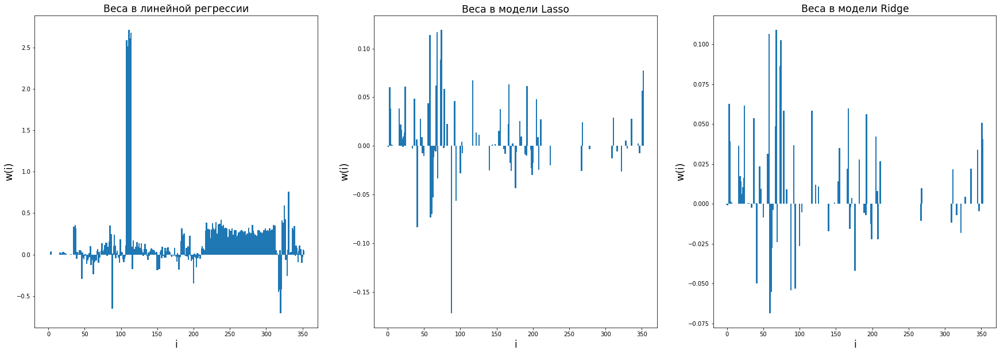

In [139]:
fig, ax = plt.subplots(1, 3, figsize = (30, 10))

ax[0].bar(x = np.arange(X_val.shape[1]), height = grid_searcher_lr.best_estimator_.coef_, width = 2)
ax[0].set_title('Веса в линейной регрессии', fontsize='xx-large')
ax[0].set_xlabel('i', fontsize='xx-large')
ax[0].set_ylabel('w(i)', fontsize='xx-large')

ax[1].bar(x = np.arange(X_val.shape[1]), height = grid_searcher_lasso.best_estimator_.coef_, width = 2)
ax[1].set_title('Веса в модели Lasso', fontsize='xx-large')
ax[1].set_xlabel('i', fontsize='xx-large')
ax[1].set_ylabel('w(i)', fontsize='xx-large')

ax[2].bar(x = np.arange(X_val.shape[1]), height = grid_searcher_ridge.best_estimator_.coef_, width = 2)
ax[2].set_title('Веса в модели Ridge', fontsize='xx-large')
ax[2].set_xlabel('i', fontsize='xx-large')
ax[2].set_ylabel('w(i)', fontsize='xx-large')

plt.show()

В линейной регрессии веса не нормализованны, поэтому выходят за пределы (-1, 1). В целом, в ней они несколько отличаются от Лассо и Гребня, где они схожи.

## 9 (0.5)

Добейтесь того, чтобы в заданиях выше ваш лучший алгоритм давал качество не больше 0.125 на тестовых данных по метрике RMSE (если вы дошли до этого задания, а качество выше уже удовлетворяет этому условию, вы автоматически получите за него полный балл).

**Если бы по-человечески обработал категориальные данные и разобрался с ordinalEncoder, то сделал бы этот номер, а так получаю заслуженную баранку...**

## 10* (0.5)

Добейтесь того, чтобы в заданиях выше ваш лучший алгоритм давал качество не больше 0.121 на тестовых данных по метрике RMSE. Для этого вы можете использовать самые разные методы, какие захотите - отбор признаков, генерация новых, разные способы предобработки данных. Единственное ограничение - не использовать никакие алгоритмы регрессии, кроме kNN, линейной регрессии, Lasso и Ridge.

In [ ]:
#Не нужны мне ваши бонусы, и так все нервы с этой домашкой потратил, делая её всю неделю...

# Теория

За данную часть можно получить бонусные баллы. Решения необходимо оформить в этом же файле в ячейках типа Markdown, пользуясь $\LaTeX$ для записи математических формул.

## 1* (0.5)

Найдите константу $C$, решающую следующую задачу ($0 < \tau < 1$ фиксировано):

$$
\sum\limits_{i=1}^\ell\rho_\tau\left(y_i - C\right) \to \min_C,
$$

где

$$
\rho_\tau(z) =
\begin{cases}
\tau z, & z > 0\\
(\tau - 1)z, & z \leq 0
\end{cases}
$$

$$
Решение:
$$

$$
\sum\limits_{i=1}^\ell
\begin {cases}
\tau \left(y_i - C\right), & y_i - C > 0\\
(\tau - 1)\left(y_i - C\right), & y_i - C \leq 0
\end {cases}
$$

$$
\text Минимизируем \space функцию \space по \space C: \frac{\partial\sum\limits_{i=1}^\ell\rho_\tau\left(y_i - C\right)}{\partial C} = 0
$$

$$
\sum\limits_{i=1}^\ell
\begin{cases}
-\tau, & y_i > C\\
1 - \tau, & y_i \leq C
\end{cases} = 0
$$

Первая производная функции растет по $C$, значит вторая производная по $C$ неотрицательна. Так, в точке экстремума достигается минимум функции. Преобразуем:

$$
\sum\limits_{i=1}^\ell\left[y_i \leq C \right] - \sum\limits_{i=1}^\ell\tau = 0
$$

=>

$$
\frac{\sum\limits_{i=1}^\ell\left[y_i \leq C \right]}{\ell} = \tau
$$

Для достижения минимума необходимо выбрать $C$, чтобы доля $y_i \leq C$ была равна $\tau$. Значит, $C = y_{(\tau)}$ - квантиль $\tau$. 